<a href="https://colab.research.google.com/github/nwferreri/dog-breed-image-classification/blob/main/dog_breed_image_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multi-class Dog Breed Image Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning
* There are 120 breeds of dogs (this means there are 120 different classes)
* There are around 10,000+ images in the training set (these images have labels)
* There are around 10,000+ images in the testing set (these images have no labels, because we'll want to predict them)

In [ ]:
# Unzip the uploaded data into Google Drive
#!unzip "/content/drive/MyDrive/ZTM/Dog Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/ZTM/Dog Vision/"

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Get our workspace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're using a GPU

In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available (YES!)" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.12.0
TF Hub version: 0.14.0
GPU available (YES!)


## Getting our data ready (turning it into Tensors)

With all machine learning models, our data has to be in numerical format.  So that's what we'll be doing first.  Turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.

In [ ]:
# Check out the labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/ZTM/Dog Vision/labels.csv")
print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

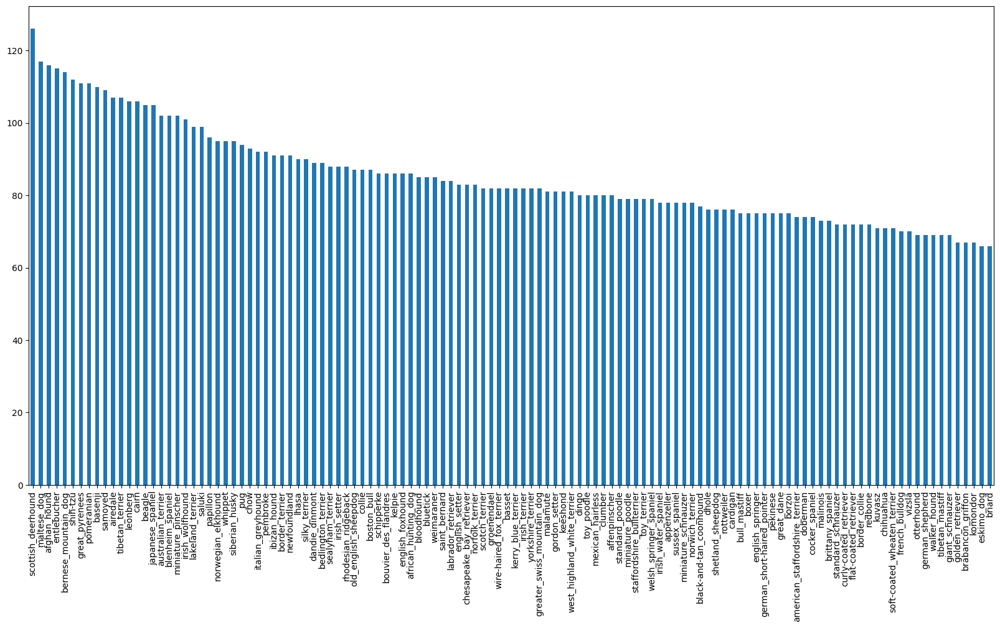

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

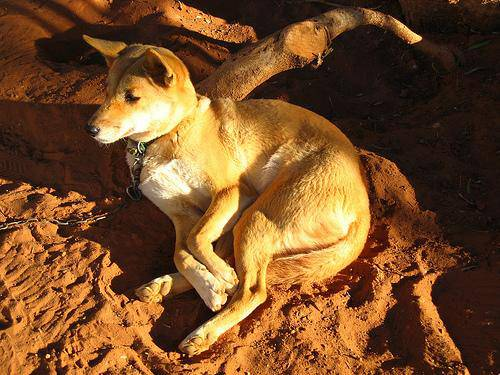

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/ZTM/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all of our image file pathnames.

In [ ]:
# Create pathnames from image ID's
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
filenames = ["drive/MyDrive/ZTM/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/ZTM/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/ZTM/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/ZTM/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/ZTM/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/ZTM/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/ZTM/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/ZTM/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/ZTM/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/ZTM/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/ZTM/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/ZTM/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files.  Proceed.")
else:
  print("Filenames do NOT match actual amount of files. Check target directory!")

Filenames match actual amount of files.  Proceed.


Since we've now got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does NOT mache number of filenames, check data directories!")

Number of labels matches number of filenames!


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn labels into boolean arrays
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

### Creating our own validation set

Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

We're going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of image to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a look at the training data
X_train[:5], y_train[:2]

(['drive/MyDrive/ZTM/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/ZTM/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/ZTM/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/ZTM/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/ZTM/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, F

## Preprocessing images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpg image into numerical Tensor with 3 color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1 values (normalize)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

To avoid memory issues with the full data set later on, we will use batches of 32 images at a time.

Also, in order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`.

In [ ]:
# Create a simple function to return a tuple of Tensors
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

Now we've got a way to turn our data into tuples of tensors in the form: `(image, label)`, let's make a function to turn all of our data (`X` & `y`) into batches.

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X))  # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a validation dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filpaths
                                               tf.constant(y)))  # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # If the data is a training data set
  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however these can be a little hard to understand/comprehend.  Let's visualize them.

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viweing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title (unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
# This unbatches data and turns into iterator
# The next function grabs the first one
train_images, train_labels = next(train_data.as_numpy_iterator())

In [ ]:
len(train_images), len(train_labels)

(32, 32)

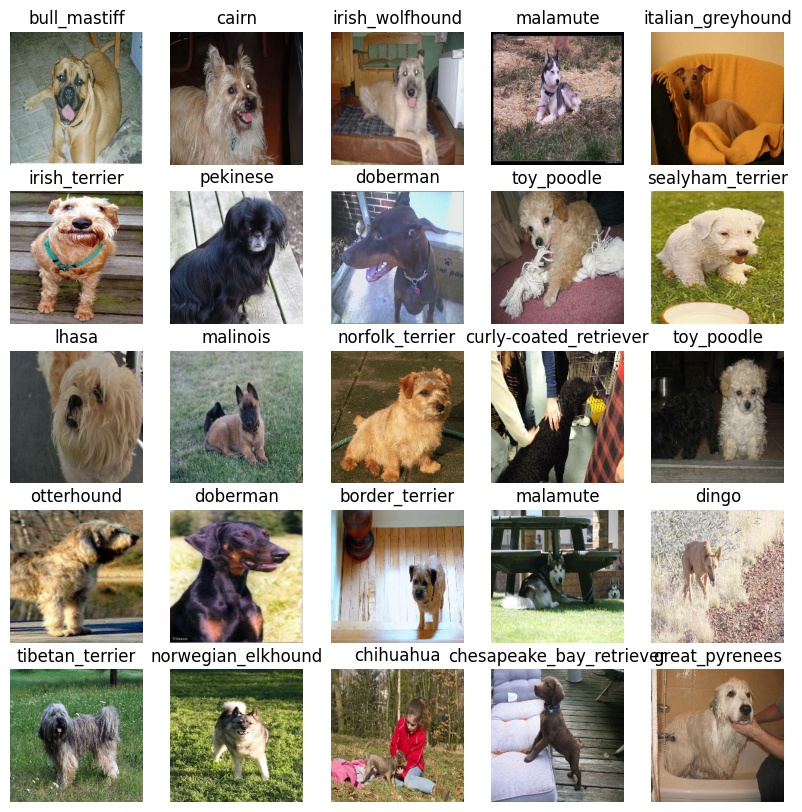

In [ ]:
# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

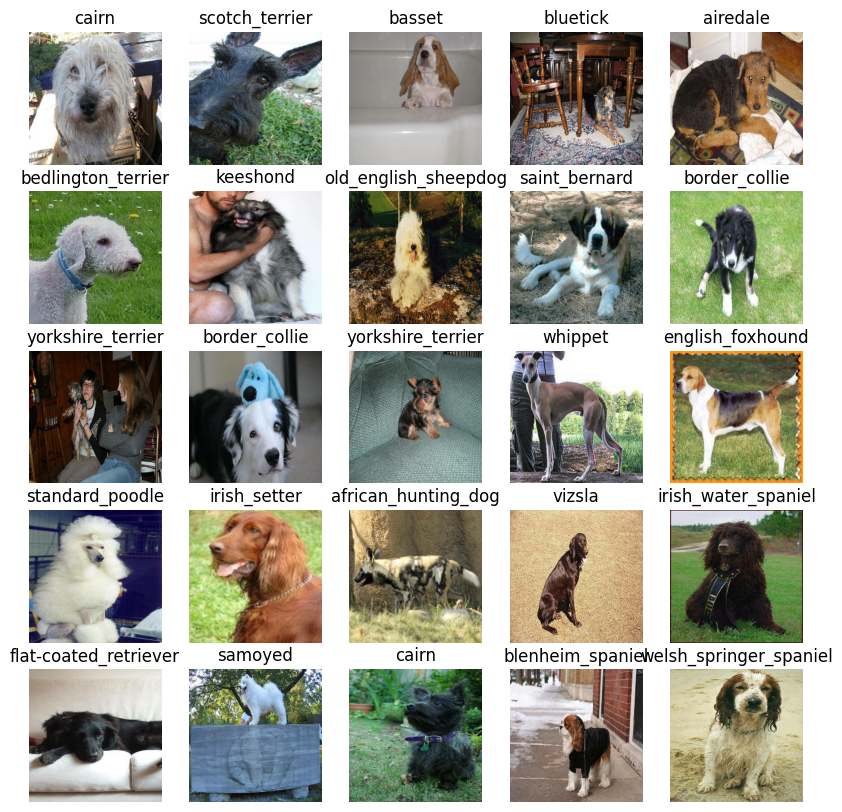

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to the model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]  # batch, height, width, color channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our inputs, outputs, and model ready to go.  Let's put them together into a Keras deep learning model.

Knowing this, let's create a function which:
* Takes the input shape, output shape, and the model we've chosen as parameters.
* Defines the layers in a Keras model in a sequential fashion (do this first, then this, then that...)
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model

All of these steps can be found here: https://www.tensorflow.org/guide/keras

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),  # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax")  # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress, or stop training if a model stops improving.

We'll create two callbacks, one for TensorBoard, which helps track our model's progress, and another for early stopping, which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our model's training logs with the `%tensorboard` magic function (we'll do this after model training).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/ZTM/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on a subset of data)

Our first model is only going to train on 1000 images to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we're still on a GPU
print("GPU", "available (YES!)" if tf.config.list_physical_devices("GPU") else "not available")

GPU available (YES!)


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model, passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`), and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data, passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 135s 3s/step - loss: 4.3824 - accuracy: 0.1150 - val_loss: 3.3014 - val_accuracy: 0.3150
Epoch 2/100
25/25 [==============================] - 5s 179ms/step - loss: 1.5373 - accuracy: 0.7013 - val_loss: 2.0855 - val_accuracy: 0.5700
Epoch 3/100
25/25 [==============================] - 4s 150ms/step - loss: 0.5282 - accuracy: 0.9463 - val_loss: 1.6105 - val_accuracy: 0.6250
Epoch 4/100
25/25 [==============================] - 4s 155ms/step - loss: 0.2378 - accuracy: 0.9925 - val_loss: 1.4266 - val_accuracy: 0.6400
Epoch 5/100
25/25 [==============================] - 5s 199ms/step - loss: 0.1414 - accuracy: 0.9987 - val_loss: 1.3408 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 3s 127ms/step - loss: 0.0958 - accuracy: 1.0000 - val_loss: 1.2995 - val_accuracy: 0.6650
Epoch 7/100
25/25 [==============================]

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its content.

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/ZTM/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 2s 103ms/step


array([[2.5547552e-03, 7.8384946e-05, 4.7036124e-04, ..., 9.4252566e-05,
        1.9638892e-05, 7.5091043e-04],
       [7.3862262e-04, 5.4476535e-05, 1.4757622e-02, ..., 1.8731304e-03,
        2.5793765e-04, 3.5579327e-05],
       [3.3214940e-06, 9.0230587e-06, 2.6623520e-06, ..., 6.1696177e-05,
        5.8746141e-06, 6.3256673e-05],
       ...,
       [2.4225437e-06, 1.4022653e-04, 3.2044878e-05, ..., 5.5155673e-05,
        1.3205118e-05, 4.7268433e-05],
       [2.3237753e-03, 1.1604690e-04, 2.5096542e-05, ..., 4.4435907e-05,
        6.6532302e-05, 7.3644905e-03],
       [4.5080465e-04, 1.8996079e-05, 4.3899022e-04, ..., 1.5912779e-03,
        9.4355829e-04, 2.3307957e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
len(predictions[0])

120

In [ ]:
np.sum(predictions[0])

0.99999994

In [ ]:
# First prediction
index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[2.55475519e-03 7.83849464e-05 4.70361236e-04 2.30464284e-05
 9.72638591e-05 1.12179514e-05 3.19948345e-02 1.59194472e-03
 5.35119558e-04 1.26427214e-04 1.07498498e-04 6.32238924e-04
 4.14539711e-04 7.18932424e-05 1.21833431e-03 5.24608826e-04
 2.13325820e-05 7.48175569e-03 1.57910642e-06 4.73291184e-05
 2.01536343e-03 7.75593289e-05 1.75085861e-05 8.98261613e-04
 1.67965685e-04 8.95528297e-04 1.76383898e-01 3.61661878e-05
 4.86474863e-04 1.49684274e-04 6.82975297e-05 1.60377729e-03
 7.21894263e-04 5.82509638e-05 1.32137240e-04 1.43339438e-02
 2.17586803e-05 1.62967321e-04 3.08165691e-05 1.66903686e-04
 7.89988611e-04 3.70924827e-05 3.61692626e-04 1.10940440e-04
 7.76981396e-05 2.32615537e-04 6.17444166e-05 4.11600980e-04
 9.60790901e-04 1.10982553e-04 7.08255684e-05 3.27195039e-06
 1.61011631e-04 2.55148898e-05 3.51768133e-04 6.76398704e-05
 5.50870143e-04 7.38010556e-03 9.03893961e-05 1.43157572e-01
 3.44484346e-04 7.62044074e-05 1.09374523e-03 1.48136151e-05
 3.84371146e-04 1.073194

Having the above functionality is great, but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

Now since our validation data is still in a batch dataset, we'll have to unbactch it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visual.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels, and an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label, and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth, and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction, and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                     np.max(pred_prob)*100,
                                     true_label),
            color=color)

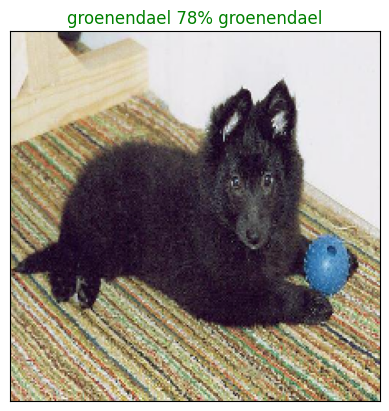

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our model's top prediction.  Let's make another to view our model's top 10 predictions.

This function will:
* Take an input of prediction probabilities array, a ground truth array, and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

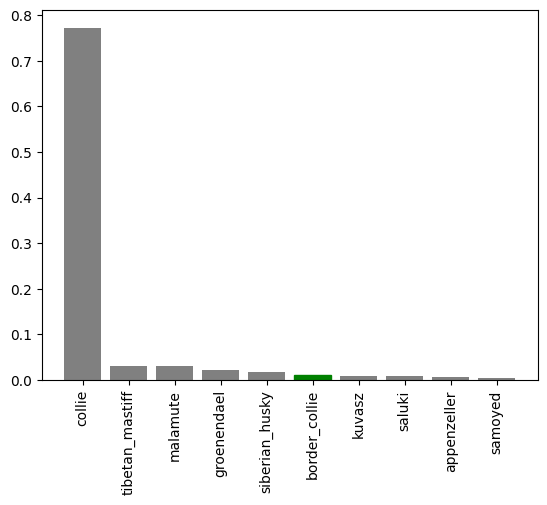

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some functions to help us visualize our predictions and evaluate our model.  Let's check out a few.

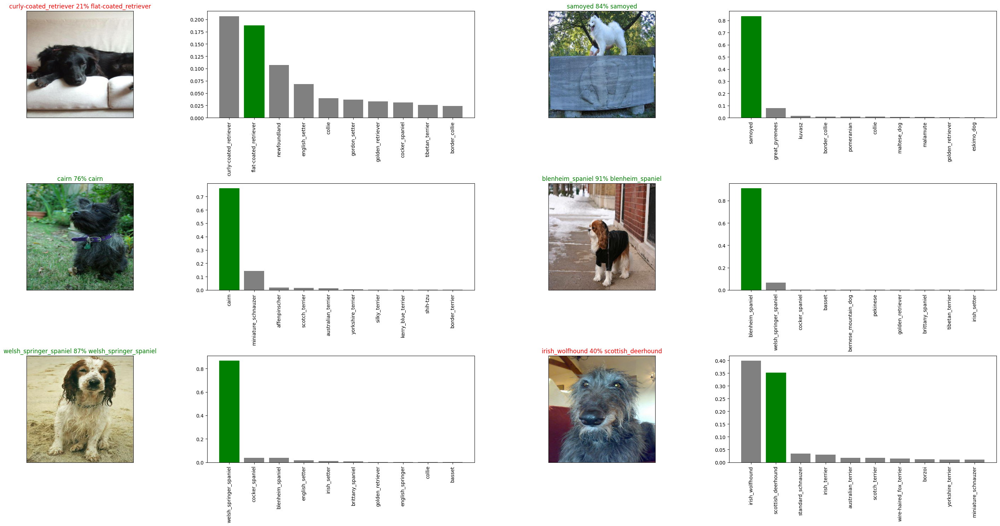

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_rows, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a model's directory and appens a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/ZTM/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5"  # Save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model.  Let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/ZTM/Dog Vision/models/20230719-190918-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/ZTM/Dog Vision/models/20230719-190918-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/ZTM/Dog Vision/models/20230719-190918-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/ZTM/Dog Vision/models/20230719-190918-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 89ms/step - loss: 1.2018 - accuracy: 0.6750


[1.2017545700073242, 0.675000011920929]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 143ms/step - loss: 1.2018 - accuracy: 0.6750


[1.2017545700073242, 0.675000011920929]

## Training a model on the full data

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note: Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 45s 119ms/step - loss: 1.3287 - accuracy: 0.6686
Epoch 2/100
320/320 [==============================] - 50s 156ms/step - loss: 0.4015 - accuracy: 0.8816
Epoch 3/100
320/320 [==============================] - 38s 118ms/step - loss: 0.2345 - accuracy: 0.9378
Epoch 4/100
320/320 [==============================] - 38s 119ms/step - loss: 0.1515 - accuracy: 0.9652
Epoch 5/100
320/320 [==============================] - 37s 114ms/step - loss: 0.1079 - accuracy: 0.9770
Epoch 6/100
320/320 [==============================] - 36s 111ms/step - loss: 0.0767 - accuracy: 0.9869
Epoch 7/100
320/320 [==============================] - 40s 125ms/step - loss: 0.0578 - accuracy: 0.9916
Epoch 8/100
320/320 [==============================] - 35s 110ms/step - loss: 0.0450 - accuracy: 0.9951
Epoch 9/100
320/320 [==============================] - 38s 118ms/step - loss: 0.0376 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 35s 110m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/ZTM/Dog Vision/models/20230719-193336-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/ZTM/Dog Vision/models/20230719-193336-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model = load_model("drive/MyDrive/ZTM/Dog Vision/models/20230719-193336-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/ZTM/Dog Vision/models/20230719-193336-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test data set

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily, we created `create_data_batches()` earlier, which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels.
* Make a predictions array by passing the test data batches to the `predict()` method call on our model.

In [ ]:
# Load test image filenames
test_path = "/content/drive/MyDrive/ZTM/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/ZTM/Dog Vision/test/df2d806debebfd39e858f877756518e8.jpg',
 '/content/drive/MyDrive/ZTM/Dog Vision/test/e63a126acd70223f2d388702843d185b.jpg',
 '/content/drive/MyDrive/ZTM/Dog Vision/test/e366960ee7583d7ffd22783085b53e5d.jpg',
 '/content/drive/MyDrive/ZTM/Dog Vision/test/df5e20faf083ef154fcd716dff396e1d.jpg',
 '/content/drive/MyDrive/ZTM/Dog Vision/test/dd1eddb779b2611cdd42de48ae623a62.jpg',
 '/content/drive/MyDrive/ZTM/Dog Vision/test/e18db768bc1a9e7e633940dcadacb231.jpg',
 '/content/drive/MyDrive/ZTM/Dog Vision/test/e1dd78810048dc387573f2ec50e4bb16.jpg',
 '/content/drive/MyDrive/ZTM/Dog Vision/test/e65bf4e655ccf594210174f124e3adf0.jpg',
 '/content/drive/MyDrive/ZTM/Dog Vision/test/e2a9a7580a1424bc6531b2b7375338db.jpg',
 '/content/drive/MyDrive/ZTM/Dog Vision/test/e648a16d81b6441658b77bca0f1be4ee.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about an hour).

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 147s 441ms/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/ZTM/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
loaded_test_predictions = np.loadtxt("drive/MyDrive/ZTM/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[4.62128037e-06, 1.08530305e-08, 5.08453779e-10, ...,
        3.13130712e-08, 2.81122834e-06, 1.25326366e-07],
       [1.99988602e-11, 5.87052496e-09, 1.23346389e-09, ...,
        3.82840232e-10, 7.23264712e-11, 6.00849981e-10],
       [4.81965508e-05, 1.49591930e-08, 5.25193173e-07, ...,
        2.56106798e-08, 1.78783193e-06, 7.07246500e-07],
       ...,
       [1.05850859e-07, 8.63842158e-12, 1.51712289e-11, ...,
        3.67101176e-11, 1.40436436e-08, 5.38956879e-09],
       [3.92543242e-08, 1.69582009e-07, 1.92231164e-06, ...,
        4.77399965e-07, 1.23781376e-06, 9.75464900e-07],
       [1.95174172e-11, 1.26014884e-11, 4.63719715e-07, ...,
        1.46376252e-07, 5.38779148e-07, 2.31357467e-09]], dtype=float32)

In [ ]:
loaded_test_predictions[:10]

array([[4.62128037e-06, 1.08530305e-08, 5.08453779e-10, ...,
        3.13130712e-08, 2.81122834e-06, 1.25326366e-07],
       [1.99988602e-11, 5.87052496e-09, 1.23346389e-09, ...,
        3.82840232e-10, 7.23264712e-11, 6.00849981e-10],
       [4.81965508e-05, 1.49591930e-08, 5.25193173e-07, ...,
        2.56106798e-08, 1.78783193e-06, 7.07246500e-07],
       ...,
       [1.05850859e-07, 8.63842158e-12, 1.51712289e-11, ...,
        3.67101176e-11, 1.40436436e-08, 5.38956879e-09],
       [3.92543242e-08, 1.69582009e-07, 1.92231164e-06, ...,
        4.77399965e-07, 1.23781376e-06, 9.75464900e-07],
       [1.95174172e-11, 1.26014884e-11, 4.63719715e-07, ...,
        1.46376252e-07, 5.38779148e-07, 2.31357467e-09]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test data set predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our model's prediction probability outputs in a DataFrame with an ID column and a column for each different dog breed. https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image IDs from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image IDs to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids[:10]

['df2d806debebfd39e858f877756518e8',
 'e63a126acd70223f2d388702843d185b',
 'e366960ee7583d7ffd22783085b53e5d',
 'df5e20faf083ef154fcd716dff396e1d',
 'dd1eddb779b2611cdd42de48ae623a62',
 'e18db768bc1a9e7e633940dcadacb231',
 'e1dd78810048dc387573f2ec50e4bb16',
 'e65bf4e655ccf594210174f124e3adf0',
 'e2a9a7580a1424bc6531b2b7375338db',
 'e648a16d81b6441658b77bca0f1be4ee']

In [ ]:
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,df2d806debebfd39e858f877756518e8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e63a126acd70223f2d388702843d185b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e366960ee7583d7ffd22783085b53e5d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,df5e20faf083ef154fcd716dff396e1d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,dd1eddb779b2611cdd42de48ae623a62,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,df2d806debebfd39e858f877756518e8,4.621280e-06,1.085303e-08,5.084538e-10,4.080508e-07,2.102584e-09,1.246534e-08,6.177800e-04,8.839745e-08,2.665847e-08,...,3.318396e-08,3.860346e-09,4.837352e-09,7.874805e-09,8.255786e-11,2.124681e-08,1.046810e-07,3.131307e-08,2.811228e-06,1.253264e-07
1,e63a126acd70223f2d388702843d185b,1.999886e-11,5.870525e-09,1.233464e-09,1.687951e-08,2.807166e-10,2.443842e-06,1.296524e-11,2.469864e-11,1.419695e-06,...,1.683680e-08,8.557067e-10,1.132749e-07,1.313514e-07,2.814221e-10,2.255223e-05,3.911607e-08,3.828402e-10,7.232647e-11,6.008500e-10
2,e366960ee7583d7ffd22783085b53e5d,4.819655e-05,1.495919e-08,5.251932e-07,2.748930e-08,1.563362e-08,3.567230e-09,7.745724e-07,7.963700e-09,4.128467e-08,...,4.863060e-07,2.816815e-08,1.665545e-09,6.056766e-09,3.459930e-10,5.159493e-09,1.378713e-06,2.561068e-08,1.787832e-06,7.072465e-07
3,df5e20faf083ef154fcd716dff396e1d,6.533670e-07,1.308469e-05,6.687158e-07,1.850995e-07,1.600507e-11,1.277075e-10,2.107949e-07,2.562333e-08,1.958306e-10,...,1.186666e-07,7.534950e-08,2.475287e-09,5.790824e-09,4.455943e-10,5.499236e-11,2.879583e-09,1.051540e-06,1.030026e-05,3.206472e-07
4,dd1eddb779b2611cdd42de48ae623a62,8.335385e-12,7.042935e-14,1.996622e-13,1.445096e-15,1.205813e-12,8.943795e-15,1.399077e-09,2.387823e-12,3.369597e-17,...,7.222697e-11,5.569075e-13,4.462008e-13,4.592191e-14,9.003568e-14,3.221455e-17,3.851623e-13,7.889198e-15,7.877650e-15,2.743958e-11


In [ ]:
# Save our predictions DataFrame to csv for submission to Kaggle
preds_df.to_csv("drive/MyDrive/ZTM/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turnthe filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction ouput probabilities to prediction labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepaths
custom_path = "/content/drive/MyDrive/ZTM/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['/content/drive/MyDrive/ZTM/Dog Vision/my-dog-photos/70699203051__F862288F-F617-463B-9CAA-1814B5100C36.jpeg',
 '/content/drive/MyDrive/ZTM/Dog Vision/my-dog-photos/70813234764__9AC38823-C328-4420-AA79-DB42E03A2446.jpeg',
 '/content/drive/MyDrive/ZTM/Dog Vision/my-dog-photos/IMG_1893.jpeg']

In [ ]:
# Turn custom images into batch data set
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)
custom_preds.shape

1/1 [==============================] - 1s 908ms/step


(3, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['cardigan', 'cardigan', 'staffordshire_bullterrier']

In [ ]:
# Get custom images (our unbatchify function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

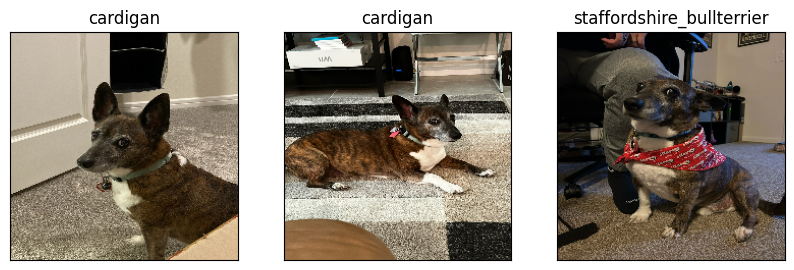

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)